In [1]:
import ast
import tensorflow as tf
from rdkit import RDLogger
from rdkit.Chem.Draw import IPythonConsole, MolsToGridImage
RDLogger.DisableLog("rdApp.*")

In [2]:
from rdkit.Chem import QED

In [3]:
from tensorflow.keras import layers

In [4]:
import pandas as pd
from chembl_webresource_client.new_client import new_client
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from warnings import filterwarnings
from rdkit.Chem import Descriptors, Lipinski
import numpy as np
from rdkit import Chem
from rdkit.Chem import Draw, PandasTools
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from tensorflow import keras
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.text import Tokenizer

In [4]:
# Set options
filterwarnings("ignore")
pd.set_option('display.max_columns',45)
pd.set_option('display.max_rows', None)

In [6]:
#Import
target = new_client.target
target_query = target.search('aromatase')
targets = pd.DataFrame.from_dict(target_query)
selected_target = targets.target_chembl_id[0]
activity = new_client.activity
res = activity.filter(target_chembl_id=selected_target).filter(standard_type="IC50")
df = pd.DataFrame.from_dict(res)
df

,activity_comment,activity_id,activity_properties,assay_chembl_id,assay_description,assay_type,assay_variant_accession,assay_variant_mutation,bao_endpoint,bao_format,bao_label,canonical_smiles,data_validity_comment,data_validity_description,document_chembl_id,document_journal,document_year,ligand_efficiency,molecule_chembl_id,molecule_pref_name,parent_molecule_chembl_id,pchembl_value,potential_duplicate,qudt_units,record_id,relation,src_id,standard_flag,standard_relation,standard_text_value,standard_type,standard_units,standard_upper_value,standard_value,target_chembl_id,target_organism,target_pref_name,target_tax_id,text_value,toid,type,units,uo_units,upper_value,value
0,None,82585,[],CHEMBL666794,Inhibition of Cytochrome P450 19A1,B,None,None,BAO_0000190,BAO_0000357,single protein format,CC12CCC(O)CC1=CCC1C2CCC2(C)C(CC3CN3)CCC12,None,None,CHEMBL1133116,J Med Chem,2000.0,"{'bei': '15.62', 'le': '0.29', 'lle': '0.86', ...",CHEMBL341591,None,CHEMBL341591,5.15,0,http://www.openphacts.org/units/Nanomolar,267172,=,1,1,=,None,IC50,nM,None,7100.0,CHEMBL1978,Homo sapiens,Cytochrome P450 19A1,9606,None,None,IC50,uM,UO_0000065,None,7.1
1,None,94540,[],CHEMBL666794,Inhibition of Cytochrome P450 19A1,B,None,None,BAO_0000190,BAO_0000357,single protein format,C[C@]12CC[C@H]3[C@@H](CC=C4C[C@@H](O)CC[C@@]43...,None,None,CHEMBL1133116,J Med Chem,2000.0,None,CHEMBL2111947,None,CHEMBL2111947,None,0,http://www.openphacts.org/units/Nanomolar,267163,>,1,1,>,None,IC50,nM,None,50000.0,CHEMBL1978,Homo sapiens,Cytochrome P450 19A1,9606,None,None,IC50,uM,UO_0000065,None,50.0
2,None,112960,[],CHEMBL661700,In vitro inhibition of human Cytochrome P450 19A1,B,None,None,BAO_0000190,BAO_0000357,single protein format,CCn1c(C(c2ccc(F)cc2)n2ccnc2)c(C)c2cc(Br)ccc21,None,None,CHEMBL1131917,Bioorg Med Chem Lett,1999.0,"{'bei': '16.06', 'le': '0.35', 'lle': '0.91', ...",CHEMBL431859,None,CHEMBL431859,6.62,0,http://www.openphacts.org/units/Nanomolar,214178,=,1,1,=,None,IC50,nM,None,238.0,CHEMBL1978,Homo sapiens,Cytochrome P450 19A1,9606,None,None,IC50,uM,UO_0000065,None,0.238
3,None,116766,[],CHEMBL661700,In vitro inhibition of human Cytochrome P450 19A1,B,None,None,BAO_0000190,BAO_0000357,single protein format,CCn1cc(C(c2ccc(F)cc2)n2ccnc2)c2ccccc21,None,None,CHEMBL1131917,Bioorg Med Chem Lett,1999.0,"{'bei': '22.68', 'le': '0.41', 'lle': '2.61', ...",CHEMBL113637,None,CHEMBL113637,7.24,0,http://www.openphacts.org/units/Nanomolar,214179,=,1,1,=,None,IC50,nM,None,57.0,CHEMBL1978,Homo sapiens,Cytochrome P450 19A1,9606,None,None,IC50,uM,UO_0000065,None,0.057
4,None,118017,[],CHEMBL661700,In vitro inhibition of human Cytochrome P450 19A1,B,None,None,BAO_0000190,BAO_0000357,single protein format,Clc1ccccc1Cn1cc(Cn2ccnc2)c2ccccc21,None,None,CHEMBL1131917,Bioorg Med Chem Lett,1999.0,"{'bei': '22.58', 'le': '0.43', 'lle': '2.68', ...",CHEMBL112021,None,CHEMBL112021,7.27,0,http://www.openphacts.org/units/Nanomolar,214173,=,1,1,=,None,IC50,nM,None,54.0,CHEMBL1978,Homo sapiens,Cytochrome P450 19A1,9606,None,None,IC50,uM,UO_0000065,None,0.054
5,None,118020,[],CHEMBL661700,In vitro inhibition of human Cytochrome P450 19A1,B,None,None,BAO_0000190,BAO_0000357,single protein format,Cc1ccc(S(=O)(=O)n2cc(C(c3ccccc3)n3ccnc3)c3cccc...,None,None,CHEMBL1131917,Bioorg Med Chem Lett,1999.0,"{'bei': '12.32', 'le': '0.23', 'lle': '0.25', ...",CHEMBL324070,None,CHEMBL324070,5.27,0,http://www.openphacts.org/units/Nanomolar,214180,=,1,1,=,None,IC50,nM,None,5400.0,CHEMBL1978,Homo sapiens,Cytochrome P450 19A1,9606,None,None,IC50,uM,UO_0000065,None,5.4
6,None,126976,[],CHEMBL661700,In vitro inhibition of human Cytochrome P450 19A1,B,None,None,BAO_0000190,BAO_0000357,single protein format,CCn1ccc2cc(C(c3ccc(F)cc3)n3ccnc3)ccc21,None,None,CHEMBL1131917,Bioorg Med Chem Lett,1999.0,"{'bei': '23.13', 'le': '0.42', 'lle': '2.76', ...",CHEMBL41761,None,CHEMBL41761,7.39,1,http://www.openphacts.org/units/Nanomolar,214175,=,1,1,=,None,IC50,nM,None,41.0,CHEMBL1978,Homo sapiens,Cytochrome P450 19A1,9606,None,N

In [7]:
#Exportation CSV
df.to_csv('VersionBrute.csv', index=False)

In [6]:
#Importation from csv
df = pd.read_csv('VersionBrute.csv')

In [7]:
df.shape


(2926, 45)

In [8]:
all_none_columns = []
for col in df.columns:
    if df[col].isnull().all():
        all_none_columns.append(col)
# Print the names of the columns that have all None values
print('Columns with all None values:', all_none_columns)

Columns with all None values: ['assay_variant_accession', 'assay_variant_mutation', 'standard_text_value', 'standard_upper_value', 'text_value', 'toid', 'upper_value']


In [9]:
(df.isnull().sum()/df.shape[0])*100

activity_comment              96.787423
activity_id                    0.000000
activity_properties            0.000000
assay_chembl_id                0.000000
assay_description              0.000000
assay_type                     0.000000
assay_variant_accession      100.000000
assay_variant_mutation       100.000000
bao_endpoint                   0.000000
bao_format                     0.000000
bao_label                      0.000000
canonical_smiles               0.000000
data_validity_comment         95.625427
data_validity_description     95.625427
document_chembl_id             0.000000
document_journal               0.854409
document_year                  0.239234
ligand_efficiency             16.302119
molecule_chembl_id             0.000000
molecule_pref_name            88.790157
parent_molecule_chembl_id      0.000000
pchembl_value                 15.105947
potential_duplicate            0.000000
qudt_units                     1.606288
record_id                      0.000000


In [10]:
#Remove 100% Nan Values
df=df.dropna(axis=1,how='all')

In [11]:
(df.isna().sum()/df.shape[0])*100

activity_comment             96.787423
activity_id                   0.000000
activity_properties           0.000000
assay_chembl_id               0.000000
assay_description             0.000000
assay_type                    0.000000
bao_endpoint                  0.000000
bao_format                    0.000000
bao_label                     0.000000
canonical_smiles              0.000000
data_validity_comment        95.625427
data_validity_description    95.625427
document_chembl_id            0.000000
document_journal              0.854409
document_year                 0.239234
ligand_efficiency            16.302119
molecule_chembl_id            0.000000
molecule_pref_name           88.790157
parent_molecule_chembl_id     0.000000
pchembl_value                15.105947
potential_duplicate           0.000000
qudt_units                    1.606288
record_id                     0.000000
relation                      2.597403
src_id                        0.000000
standard_flag            

In [12]:

df = df.drop(['activity_comment','data_validity_description','standard_relation','qudt_units','data_validity_comment','activity_properties','units','value','standard_relation','molecule_pref_name'], axis=1)

In [13]:
same_value_cols = []

# Loop through all columns in the DataFrame
for col in df.columns:

    # Get the unique values in the current column
    unique_values = df[col].unique()

    # Check if the length of unique values is 1, which means all rows have the same value
    if len(unique_values) == 1:
        same_value_cols.append(col)

# Print the list of column names that contain the same value in all rows
print(same_value_cols)

['bao_endpoint', 'standard_type', 'target_chembl_id', 'target_organism', 'target_pref_name', 'target_tax_id']


In [14]:
df = df.drop(['bao_endpoint','standard_type','target_chembl_id','target_organism', 'target_pref_name', 'target_tax_id'], axis=1)

In [15]:
#Remove duplicated values
df = df.drop_duplicates(['canonical_smiles'])
df.shape

(2164, 23)

In [16]:
df.columns

Index(['activity_id', 'assay_chembl_id', 'assay_description', 'assay_type',
       'bao_format', 'bao_label', 'canonical_smiles', 'document_chembl_id',
       'document_journal', 'document_year', 'ligand_efficiency',
       'molecule_chembl_id', 'parent_molecule_chembl_id', 'pchembl_value',
       'potential_duplicate', 'record_id', 'relation', 'src_id',
       'standard_flag', 'standard_units', 'standard_value', 'type',
       'uo_units'],
      dtype='object')

In [17]:
#Pourcentage des valeurs null
(df.isnull().sum()/df.shape[0])*100

activity_id                   0.000000
assay_chembl_id               0.000000
assay_description             0.000000
assay_type                    0.000000
bao_format                    0.000000
bao_label                     0.000000
canonical_smiles              0.000000
document_chembl_id            0.000000
document_journal              0.184843
document_year                 0.184843
ligand_efficiency            17.236599
molecule_chembl_id            0.000000
parent_molecule_chembl_id     0.000000
pchembl_value                16.312384
potential_duplicate           0.000000
record_id                     0.000000
relation                      3.327172
src_id                        0.000000
standard_flag                 0.000000
standard_units                2.079482
standard_value                3.327172
type                          0.000000
uo_units                      2.079482
dtype: float64

In [29]:
# Imputation Ligand_efficiency
def calculate_le(smiles):
    # Convert SMILES string to RDKit Mol object
    mol = Chem.MolFromSmiles(smiles)
    if mol is None:
        # Return None if RDKit cannot parse the SMILES string
        return None
    # Calculate molecular weight, number of hydrogen bond donors, and number of hydrogen bond acceptors
    mw = Descriptors.ExactMolWt(mol)
    hbd = Descriptors.NumHDonors(mol)
    hba = Descriptors.NumHAcceptors(mol)
    # Calculate ligand efficiency and return the result
    return (mw - 18 * (hbd + hba)) / mw

In [30]:
df['ligand_efficiency'] = df['canonical_smiles'].apply(calculate_le)

In [31]:
# Imputation pchembl_val
def calculate_pchembl(smiles):
    # Convert the SMILES string to a molecule object
    mol = Chem.MolFromSmiles(smiles)
    
    # If the molecule cannot be created, return None
    if mol is None:
        return None
    
    # Calculate the molecular logP of the molecule
    pka = Descriptors.MolLogP(mol)
    
    # Set the pH value to 7.4 (the pH used in ChEMBL database)
    ph = 7.4
    
    # Calculate the predicted pChEMBL value using the Henderson-Hasselbalch equation
    # (pChEMBL = pH - pKa)
    return 10 ** (ph - pka)

In [32]:
df['pchembl_value'] = df['canonical_smiles'].apply(calculate_pchembl)

In [33]:
# Imputation document_journal
# Replace empty strings with NaN
df = df.replace('', np.nan)

# Impute missing values in the "document_journal" column with the mode
mode = df['document_journal'].mode()[0]
mode2 = df['document_year'].mode()[0]
df['document_year'] = df['document_year'].fillna(mode2)
df['document_journal'] = df['document_journal'].fillna(mode)

In [34]:
#Pourcentage des valeurs null
(df.isnull().sum()/df.shape[0])*100

activity_id                  0.0
assay_chembl_id              0.0
assay_description            0.0
assay_type                   0.0
bao_format                   0.0
bao_label                    0.0
canonical_smiles             0.0
document_chembl_id           0.0
document_journal             0.0
document_year                0.0
ligand_efficiency            0.0
molecule_chembl_id           0.0
parent_molecule_chembl_id    0.0
pchembl_value                0.0
potential_duplicate          0.0
record_id                    0.0
relation                     0.0
src_id                       0.0
standard_flag                0.0
standard_units               0.0
standard_value               0.0
type                         0.0
uo_units                     0.0
dtype: float64

In [35]:
df['standard_units'].value_counts()

nM         2064
ug.mL-1      28
Name: standard_units, dtype: int64

In [36]:
df['standard_value'].isna().sum()

0

In [37]:
df.dropna(subset=[ 'standard_value'], inplace=True)
df.shape

(2092, 23)

In [38]:
#Pourcentage des valeurs null
(df.isnull().sum()/df.shape[0])*100

activity_id                  0.0
assay_chembl_id              0.0
assay_description            0.0
assay_type                   0.0
bao_format                   0.0
bao_label                    0.0
canonical_smiles             0.0
document_chembl_id           0.0
document_journal             0.0
document_year                0.0
ligand_efficiency            0.0
molecule_chembl_id           0.0
parent_molecule_chembl_id    0.0
pchembl_value                0.0
potential_duplicate          0.0
record_id                    0.0
relation                     0.0
src_id                       0.0
standard_flag                0.0
standard_units               0.0
standard_value               0.0
type                         0.0
uo_units                     0.0
dtype: float64

In [39]:
df['standard_units'].unique()

array(['nM', 'ug.mL-1'], dtype=object)

In [40]:
# Define a dictionary to map the different units to the conversion factor
unit_conversion = {'nM': 1e-9,'ug.mL-1': 1e-6}

# Define the target unit you want to convert the data to
target_unit = 'nM'

# Iterate over each row in the DataFrame
for index, row in df.iterrows():
    # Get the current standard_value and unit
    current_value = row['standard_value']
    current_unit = row['standard_units']
    
    # Convert the current standard_value to the target unit using the conversion factor
    converted_value = current_value * unit_conversion[current_unit] / unit_conversion[target_unit]
    
    # Update the standard_value and standard_units columns with the converted value and target unit
    df.at[index, 'standard_value'] = converted_value
    df.at[index, 'standard_units'] = target_unit

In [41]:
#Standard_units after converting
df['standard_units'].value_counts()

nM    2092
Name: standard_units, dtype: int64

In [42]:
#pIC50
df['pIC50'] = -1 * (df['standard_value'] * pd.np.log10(10**-9))

C:\Users\houss\AppData\Local\Temp/ipykernel_17732/1701222783.py:2: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  df['pIC50'] = -1 * (df['standard_value'] * pd.np.log10(10**-9))


In [43]:
#finger print
# Load the dataset containing canonical SMILES strings

# Define the encoding function
def encode_smiles(smiles):
    mol = Chem.MolFromSmiles(smiles)
    seq = Chem.rdMolDescriptors.GetMorganFingerprintAsBitVect(mol, radius=2, nBits=2048)
    return seq.ToBitString()

# Apply the encoding function to all rows of the dataset
df['fingerprint_encoded'] = df['canonical_smiles'].apply(encode_smiles)

In [44]:
#Exportation CSV
df.to_csv('AfterImputation.csv', index=False)

In [45]:
#Importation from csv
df = pd.read_csv('AfterImputation.csv')

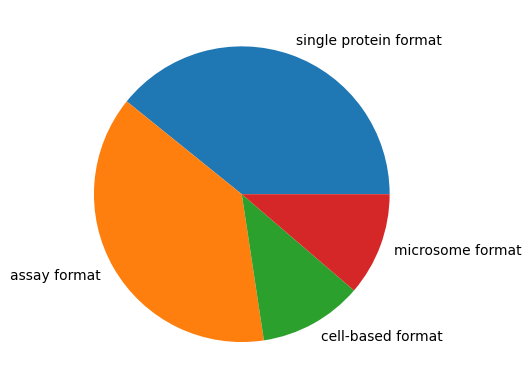

In [37]:
#Bao_label
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
dfbao = pd.DataFrame(df['bao_label'])
value_counts = df['bao_label'].value_counts()
new_df = pd.DataFrame({'bao_label': value_counts.index, 'count': value_counts.values})
y = df['bao_label'].value_counts()
mylabels = new_df['bao_label']
plt.pie(y, labels = mylabels)
plt.show() 

1    2092
Name: standard_flag, dtype: int64

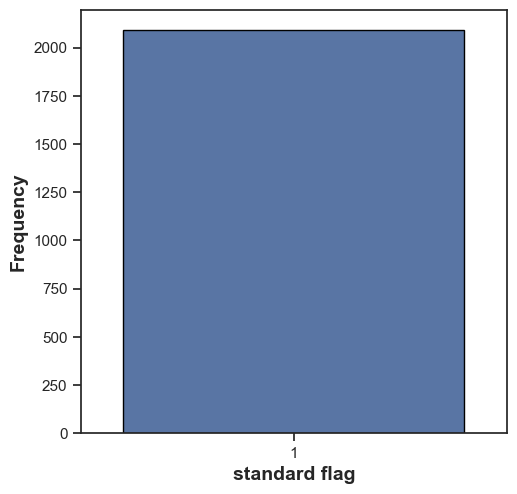

In [38]:
#standard_flag
import seaborn as sns
sns.set(style='ticks')
import matplotlib.pyplot as plt
plt.figure(figsize=(5.5, 5.5))
sns.countplot(x='standard_flag', data=df, edgecolor='black')
plt.xlabel('standard flag', fontsize=14, fontweight='bold')
plt.ylabel('Frequency', fontsize=14, fontweight='bold')
df["standard_flag"].value_counts()

In [46]:
#Longest and shortest SMILES string 
# Index of the longest SMILES string
longest_smiles = max(df["canonical_smiles"], key=len)
longest_smiles_index = df.canonical_smiles[df.canonical_smiles == longest_smiles].index.tolist()
print(f"Longest SMILES: {longest_smiles}")
print(f"Contains {len(longest_smiles)} characters, index in dataframe: {longest_smiles_index[0]}.")
smiles_maxlen = len(longest_smiles)
# NBVAL_CHECK_OUTPUT

Longest SMILES: CC(=O)O[C@H]1CC[C@]2(C)[C@H]3CC=C4[C@@H]5[C@@H](C)[C@H](C)CC[C@]5(C(=O)NCCCN5CCN(CCCN)CC5)CC[C@@]4(C)[C@]3(C)CC[C@H]2C1(C)C
Contains 123 characters, index in dataframe: 885.


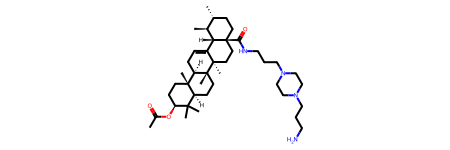

In [47]:
# Draw the molecules with the longest SMILES
longest_smiles_mol = Chem.MolFromSmiles(longest_smiles)
longest_smiles_mol

In [48]:
# Index of the shortest SMILES string
shortest_smiles = min(df["canonical_smiles"], key=len)
shortest_smiles_index = df.canonical_smiles[df.canonical_smiles == shortest_smiles].index.tolist()
print(f"Shortest SMILES: {shortest_smiles}")
print(
    f"Contains {len(shortest_smiles)} characters, index in dataframe: {shortest_smiles_index[0]}."
)
# NBVAL_CHECK_OUTPUT

Shortest SMILES: O=c1ccc2c(o1)CCCC2
Contains 18 characters, index in dataframe: 840.


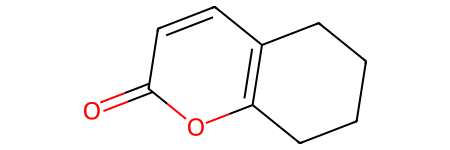

In [49]:
# Draw the molecules with the shortest SMILES
shortest_smiles_mol = Chem.MolFromSmiles(shortest_smiles)
shortest_smiles_mol

In [50]:
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw
from rdkit.Chem import PandasTools
from rdkit.Chem import AllChem
df2=df
PandasTools.AddMoleculeColumnToFrame(df2, smilesCol="canonical_smiles", molCol="Mol2D")
Draw.MolsToGridImage(list(df2.Mol2D[0:10]), legends=list(df2.molecule_chembl_id	[0:20]), molsPerRow=5)
df2

,activity_id,assay_chembl_id,assay_description,assay_type,bao_format,bao_label,canonical_smiles,document_chembl_id,document_journal,document_year,...,relation,src_id,standard_flag,standard_units,standard_value,type,uo_units,pIC50,fingerprint_encoded,Mol2D
0,82585,CHEMBL666794,Inhibition of Cytochrome P450 19A1,B,BAO_0000357,single protein format,CC12CCC(O)CC1=CCC1C2CCC2(C)C(CC3CN3)CCC12,CHEMBL1133116,J Med Chem,2000.0,...,=,1,1,nM,7100.0,IC50,UO_0000065,63900.0,0000000100000000100000000000000000000000000000...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C43...
1,94540,CHEMBL666794,Inhibition of Cytochrome P450 19A1,B,BAO_0000357,single protein format,C[C@]12CC[C@H]3[C@@H](CC=C4C[C@@H](O)CC[C@@]43...,CHEMBL1133116,J Med Chem,2000.0,...,>,1,1,nM,50000.0,IC50,UO_0000065,450000.0,0000000100000000100000000000000000000000000000...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C43...
2,112960,CHEMBL661700,In vitro inhibition of human Cytochrome P450 19A1,B,BAO_0000357,single protein format,CCn1c(C(c2ccc(F)cc2)n2ccnc2)c(C)c2cc(Br)ccc21,CHEMBL1131917,Bioorg Med Chem Lett,1999.0,...,=,1,1,nM,238.0,IC50,UO_0000065,2142.0,0100000000000000000000000000000000100000000001...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C43...
3,116766,CHEMBL661700,In vitro inhibition of human Cytochrome P450 19A1,B,BAO_0000357,single protein format,CCn1cc(C(c2ccc(F)cc2)n2ccnc2)c2ccccc21,CHEMBL1131917,Bioorg Med Chem Lett,1999.0,...,=,1,1,nM,57.0,IC50,UO_0000065,513.0,0100000000000000000000000000000000100000000001...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C43...
4,118017,CHEMBL661700,In vitro inhibition of human Cytochrome P450 19A1,B,BAO_0000357,single protein format,Clc1ccccc1Cn1cc(Cn2ccnc2)c2ccccc21,CHEMBL1131917,Bioorg Med Chem Lett,1999.0,...,=,1,1,nM,54.0,IC50,UO_0000065,486.0,0000000000000000000000000000000000000000000001...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C43...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2087,24377180,CHEMBL5037521,Inhibition of human aromatase assessed as redu...,B,BAO_0000357,single protein format,CC(Cn1ccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,CHEMBL5036334,Eur J Med Chem,2021.0,...,=,1,1,nM,1002.0,IC50,UO_0000065,9018.0,0000000000000000000000000000000000000000000000...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C53...
2088,24377181,CHEMBL5037521,Inhibition of human aromatase assessed as redu...,B,BAO_0000357,single protein format,CCC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,CHEMBL5036334,Eur J Med Chem,2021.0,...,=,1,1,nM,900.0,IC50,UO_0000065,8100.0,0000000000000000000000000000000000000000000000...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C53...
2089,24377182,CHEMBL5037521,Inhibition of human aromatase assessed as redu...,B,BAO_0000357,single protein format,CC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,CHEMBL5036334,Eur J Med Chem,2021.0,...,=,1,1,nM,3240.0,IC50,UO_0000065,29160.0,0000000000000000000000000000000000000000000000...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C53...
2090,24377183,CHEMBL5037521,Inhibition of human aromatase assessed as redu...,B,BAO_0000357,single protein format,CCC(CCc1c[nH]cn1)=C(c1ccc(O)cc1)c1ccc(O)cc1,CHEMBL5036334,Eur J Med Chem,2021.0,...,=,1,1,nM,52.0,IC50,UO_0000065,468.0,0000000000000000000000000000000000000000000000...,<rdkit.Chem.rdchem.Mol object at 0x000001A8C53...


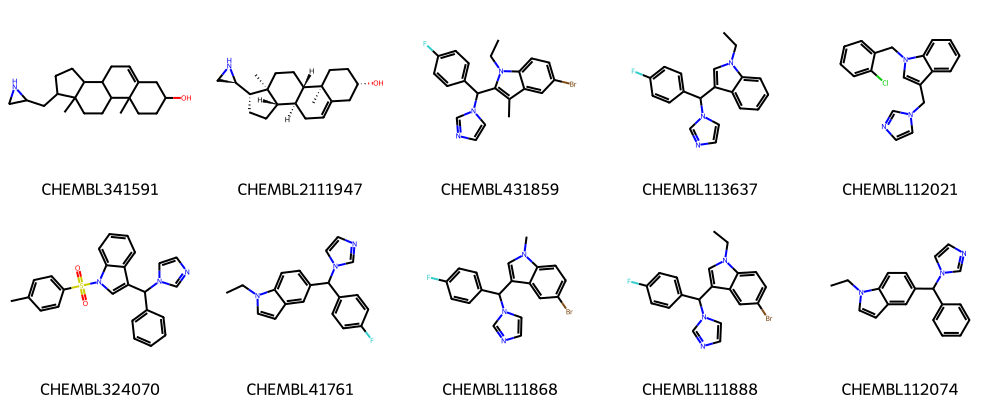

In [51]:
# Using PandasTools and the respective Draw method
PandasTools.AddMoleculeColumnToFrame(df2, smilesCol="canonical_smiles", molCol="Mol2D")
Draw.MolsToGridImage(list(df2.Mol2D[0:10]), legends=list(df2.molecule_chembl_id[0:20]), molsPerRow=5)

Text(0, 0.5, 'number of occurence')

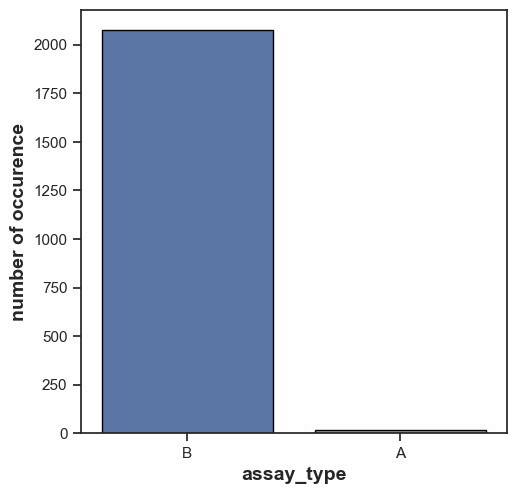

In [45]:
#assay_type
plt.figure(figsize=(5.5, 5.5))
sns.countplot(x='assay_type', data=df, edgecolor='black')
plt.xlabel('assay_type', fontsize=14, fontweight='bold')
plt.ylabel('number of occurence', fontsize=14, fontweight='bold')

In [46]:
df["assay_type"].value_counts()

B    2076
A      16
Name: assay_type, dtype: int64

In [52]:
# load your dataset into a pandas DataFrame
dfEnco = df
columns_to_drop=["canonical_smiles","fingerprint_encoded","Mol2D"]
dfEnco = dfEnco.drop(columns_to_drop, axis=1)

    # Check if the column contains numeric values
for col in dfEnco.columns:
    # Check if the column contains numeric values
    if pd.to_numeric(dfEnco[col], errors='coerce').notnull().all():
          if not any(dfEnco[col].dtype == dtype for dtype in [float, int]):
            # Convert the column to either int or float based on the range of the values
            if dfEnco[col].min() >= 0 and dfEnco[col].max() <= 255:
                dfEnco[col] = dfEnco[col].astype('uint8')
            elif dfEnco[col].min() >= -32768 and dfEnco[col].max() <= 32767:
                dfEnco[col] = dfEnco[col].astype('int16')
            elif dfEnco[col].min() >= -2147483648 and dfEnco[col].max() <= 2147483647:
                dfEnco[col] = dfEnco[col].astype('int32')
            else:
                dfEnco[col] = dfEnco[col].astype('float')

In [53]:
Categorical_col=dfEnco.select_dtypes(include='object').columns
le = LabelEncoder()
for col in Categorical_col:
    dfEnco[col] = le.fit_transform(dfEnco[col])

In [54]:
dfEnco

,activity_id,assay_chembl_id,assay_description,assay_type,bao_format,bao_label,document_chembl_id,document_journal,document_year,ligand_efficiency,...,potential_duplicate,record_id,relation,src_id,standard_flag,standard_units,standard_value,type,uo_units,pIC50
0,82585,182,44,1,3,3,33,4,2000.0,0.781336,...,0,267172,1,1,1,0,7100.0,1,0,63900.0
1,94540,182,44,1,3,3,33,4,2000.0,0.771614,...,0,267163,2,1,1,0,50000.0,1,0,450000.0
2,112960,156,14,1,3,3,32,2,1999.0,0.868637,...,0,214178,1,1,1,0,238.0,1,0,2142.0
3,116766,156,14,1,3,3,32,2,1999.0,0.830800,...,0,214179,1,1,1,0,57.0,1,0,513.0
4,118017,156,14,1,3,3,32,2,1999.0,0.831830,...,0,214173,1,1,1,0,54.0,1,0,486.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2087,24377180,131,104,1,3,3,175,3,2021.0,0.647217,...,0,3776552,1,1,1,0,1002.0,1,0,9018.0
2088,24377181,131,104,1,3,3,175,3,2021.0,0.739261,...,0,3776553,1,1,1,0,900.0,1,0,8100.0
2089,24377182,131,104,1,3,3,175,3,2021.0,0.728226,...,0,3776554,1,1,1,0,3240.0,1,0,29160.0
2090,24377183,131,104,1,3,3,175,3,2021.0,0.676809,...,0,3776555,1,1,1,0,52.0,1,0,468.0


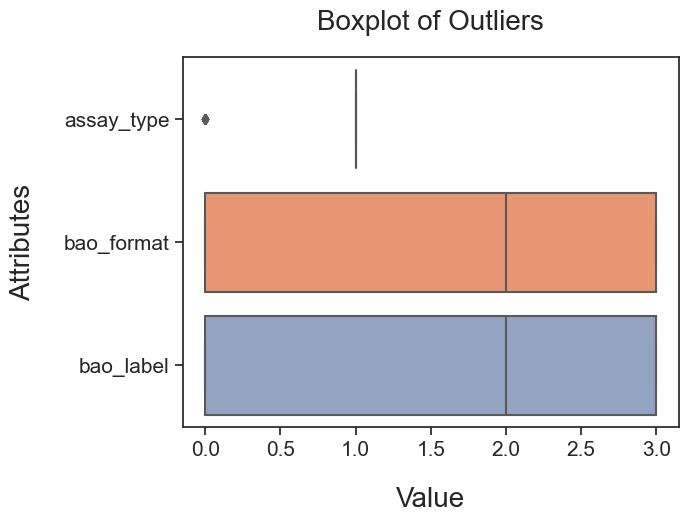

In [50]:
column=['assay_type','bao_format', 'bao_label']
ax = sns.boxplot(data = dfEnco[column], orient = "h", palette = "Set2")
#add labels
ax.set_xlabel("Value", fontsize = 20, labelpad = 20)
ax.set_ylabel("Attributes", fontsize = 20, labelpad = 20)
ax.set_title("Boxplot of Outliers", fontsize = 20,pad = 20)
#edit ticks
ax.tick_params(which = "both", labelsize = 15)

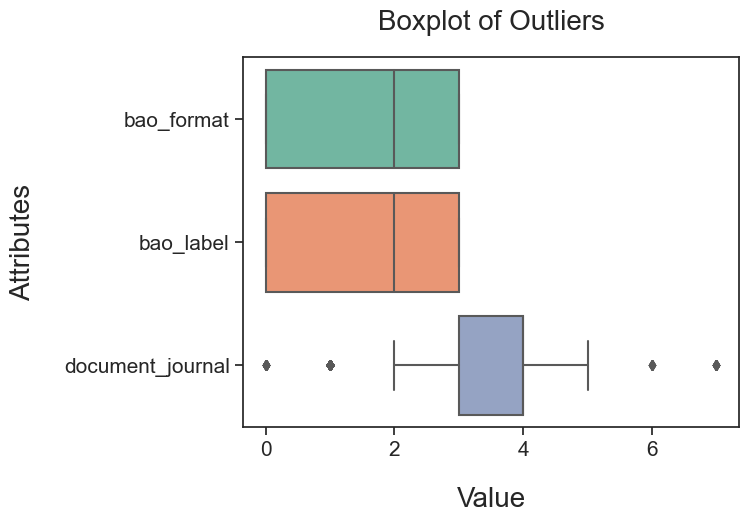

In [51]:
column=[ 'bao_format', 'bao_label' ,'document_journal' ]
ax = sns.boxplot(data = dfEnco[column], orient = "h", palette = "Set2")
#add labels
ax.set_xlabel("Value", fontsize = 20, labelpad = 20)
ax.set_ylabel("Attributes", fontsize = 20, labelpad = 20)
ax.set_title("Boxplot of Outliers", fontsize = 20,pad = 20)
#edit ticks
ax.tick_params(which = "both", labelsize = 15)

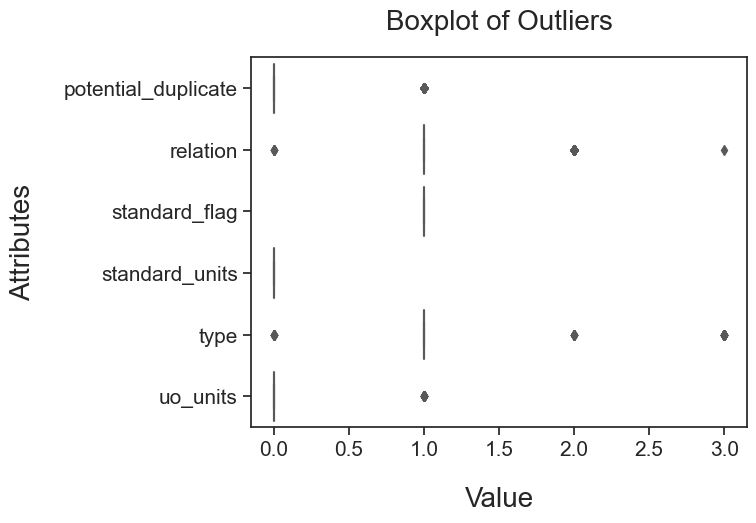

In [52]:
column=['potential_duplicate',
       'relation',  'standard_flag',
        'standard_units', 'type', 'uo_units']
ax = sns.boxplot(data = dfEnco[column], orient = "h", palette = "Set2")
#add labels
ax.set_xlabel("Value", fontsize = 20, labelpad = 20)
ax.set_ylabel("Attributes", fontsize = 20, labelpad = 20)
ax.set_title("Boxplot of Outliers", fontsize = 20,pad = 20)
#edit ticks
ax.tick_params(which = "both", labelsize = 15)

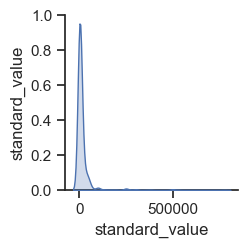

In [53]:
# Select the relevant columns for EDA
cols = ['standard_value']
# Plot pairwise scatterplots for the relevant columns
sns.pairplot(dfEnco[cols], diag_kind='kde')
plt.show()
# Define a function to detect outliers using the IQR method
def detect_outliers_iqr(data, threshold=1.5):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    return ((data < Q1 - threshold*IQR) | (data > Q3 + threshold*IQR))

# Apply the detect_outliers_iqr function to the relevant columns in the DataFrame
outlier_cols =  ['standard_value']
outliers = dfEnco[outlier_cols][detect_outliers_iqr(dfEnco[outlier_cols])]

In [62]:
# Loop through rows and get number of atoms for each molecule
num_atoms_list = []
for smiles in df['canonical_smiles']:
    # Create an RDKit molecule object from the SMILES string
    mol = Chem.MolFromSmiles(smiles)
    # Get the number of atoms in the molecule
    num_atoms = mol.GetNumAtoms()
    # Add the number of atoms to the list
    num_atoms_list.append(num_atoms)
# Add the num_atoms_list as a new column to the DataFrame
df['num_atoms'] = num_atoms_list

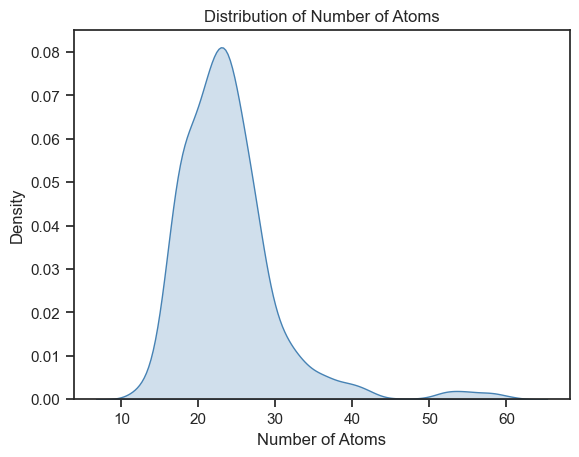

In [55]:
sns.kdeplot(df['num_atoms'], shade=True, color='steelblue')
plt.xlabel('Number of Atoms')
plt.ylabel('Density')
plt.title('Distribution of Number of Atoms')
plt.show()

In [63]:
mols = [Chem.MolFromSmiles(smiles) for smiles in df['canonical_smiles']]
df['num_rings'] = [Descriptors.RingCount(mol) for mol in mols]

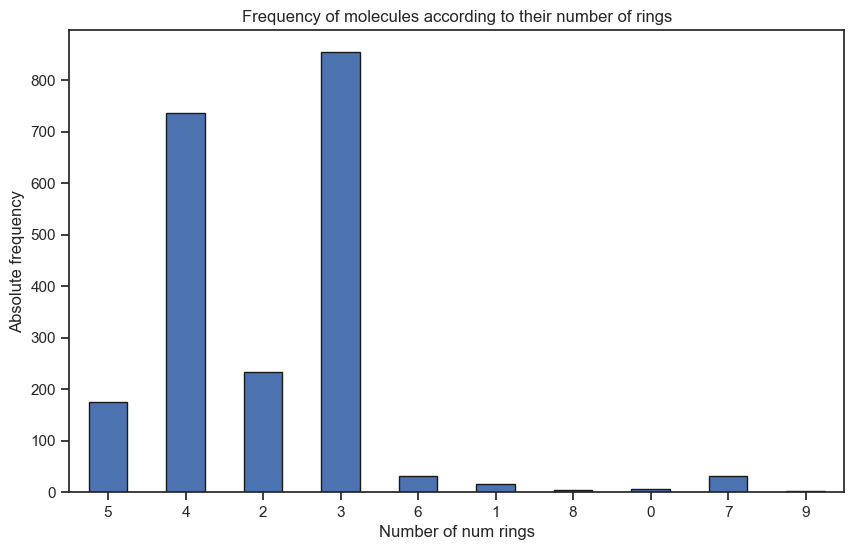

In [57]:
df['num_rings'].value_counts(sort=False).plot.bar(figsize=(10,6), 
                                                     title="Frequency of molecules according to their number of rings", 
                                                     xlabel='Number of num rings',
                                                     ylabel='Absolute frequency',
                                                     rot=0,
                                                     edgecolor='k')
plt.show()

In [64]:
Class = []
for i in df.standard_value:
  if float(i) >= 10000.0:
    Class.append("inactive")
  elif float(i) <= 1000.0:
    Class.append("active")
  elif float(i) > 1000.0 and float(i) < 10000.0:
    Class.append("intermediate")

In [65]:
bioactivity_class = pd.Series(Class, name='Class')
df= pd.concat([df, bioactivity_class], axis=1, join='inner')

Text(0, 0.5, 'Frequency')

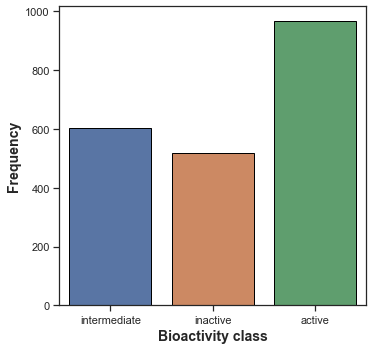

In [58]:
import seaborn as sns
sns.set(style='ticks')
import matplotlib.pyplot as plt
plt.figure(figsize=(5.5, 5.5))
sns.countplot(x='Class', data=df, edgecolor='black')
plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('Frequency', fontsize=14, fontweight='bold')

In [66]:
def lipinski(smiles, verbose=False):

    moldata= []
    for elem in smiles:
        mol=Chem.MolFromSmiles(elem) 
        moldata.append(mol)
       
    baseData= np.arange(1,1)
    i=0  
    for mol in moldata:         
        desc_MolWt = Descriptors.MolWt(mol)
        desc_MolLogP = Descriptors.MolLogP(mol)
        desc_NumHDonors = Lipinski.NumHDonors(mol)
        desc_NumHAcceptors = Lipinski.NumHAcceptors(mol)
        desc_psa = Chem.rdMolDescriptors.CalcTPSA(mol)
        desc_rotb = Chem.rdMolDescriptors.CalcNumRotatableBonds(mol)
        desc_ValEl = Descriptors.NumValenceElectrons(mol)
        desc_aliphCarb = Descriptors.NumAliphaticCarbocycles(mol) 
        desc_NumHeter = Descriptors.NumHeteroatoms(mol)
        #desc_Rings= Descriptors.RingCount(mol)

    
        row = np.array([desc_MolWt,desc_MolLogP,desc_NumHDonors,desc_NumHAcceptors,desc_psa,
                       desc_rotb,desc_ValEl,desc_aliphCarb,desc_NumHeter
                        #,desc_Rings
                       ])   
        if(i==0):
            baseData=row
        else:
            baseData=np.vstack([baseData, row])
        i=i+1      
    
    columnNames=["MW","LogP","NumHDonors","NumHAcceptors","PolarSurface","Rotatable","ValenceElect","NumAliphaticCarboc",
                "NumHeteroat"]   
    descriptors = pd.DataFrame(data=baseData,columns=columnNames)
    
    return descriptors

In [67]:
dfInsert = df[['molecule_chembl_id','pIC50','canonical_smiles','standard_value','num_rings','num_atoms','Class']]
dfLipinski = lipinski(df.canonical_smiles)
dfProp= pd.concat([dfInsert,dfLipinski],axis=1,join="inner")
dfProp

,molecule_chembl_id,pIC50,canonical_smiles,standard_value,num_rings,num_atoms,Class,Class,MW,LogP,NumHDonors,NumHAcceptors,PolarSurface,Rotatable,ValenceElect,NumAliphaticCarboc,NumHeteroat
0,CHEMBL341591,63900.0,CC12CCC(O)CC1=CCC1C2CCC2(C)C(CC3CN3)CCC12,7100.0,5,24,intermediate,intermediate,329.528,4.28820,2.0,2.0,42.17,2.0,134.0,4.0,2.0
1,CHEMBL2111947,450000.0,C[C@]12CC[C@H]3[C@@H](CC=C4C[C@@H](O)CC[C@@]43...,50000.0,5,23,inactive,inactive,315.501,3.89810,2.0,2.0,42.17,1.0,128.0,4.0,2.0
2,CHEMBL431859,2142.0,CCn1c(C(c2ccc(F)cc2)n2ccnc2)c(C)c2cc(Br)ccc21,238.0,4,26,active,active,412.306,5.70542,0.0,3.0,22.75,4.0,132.0,0.0,5.0
3,CHEMBL113637,513.0,CCn1cc(C(c2ccc(F)cc2)n2ccnc2)c2ccccc21,57.0,4,24,active,active,319.383,4.63450,0.0,3.0,22.75,4.0,120.0,0.0,4.0
4,CHEMBL112021,486.0,Clc1ccccc1Cn1cc(Cn2ccnc2)c2ccccc21,54.0,4,23,active,active,321.811,4.58780,0.0,3.0,22.75,4.0,114.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2087,CHEMBL5087363,9018.0,CC(Cn1ccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,1002.0,3,23,intermediate,intermediate,306.365,3.81630,2.0,4.0,58.28,4.0,116.0,0.0,4.0
2088,CHEMBL5092560,8100.0,CCC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,900.0,3,26,active,active,345.442,5.33750,2.0,3.0,53.35,6.0,132.0,0.0,3.0
2089,CHEMBL5092843,29160.0,CC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,3240.0,3,25,intermediate,intermediate,331.415,4.94740,2.0,3.0,53.35,5.0,126.0,0.0,3.0
2090,CHEMBL5074047,468.0,CCC(CCc1c[nH]cn1)=C(c1ccc(O)cc1)c1ccc(O)cc1,52.0,3,25,active,active,334.419,4.66560,3.0,3.0,69.14,6.0,128.0,0.0,4.0


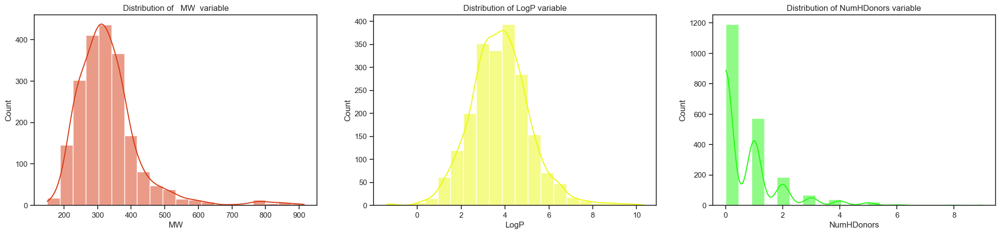

In [63]:
fig, axes = plt.subplots(1, 3, figsize = (25, 5))
ax = axes.flatten()
sns.histplot(ax = axes[0], x = dfProp["MW"], bins = 20, kde = True, color = "#D63913").set(title = "Distribution of   MW  variable");
sns.histplot(ax = axes[1], x = dfProp["LogP"], bins = 20, kde = True, color = "#EAF90E").set(title = "Distribution of LogP variable");
sns.histplot(ax = axes[2], x = dfProp["NumHDonors"], bins = 20, kde = True, color = "#20F90E").set(title = "Distribution of NumHDonors variable");

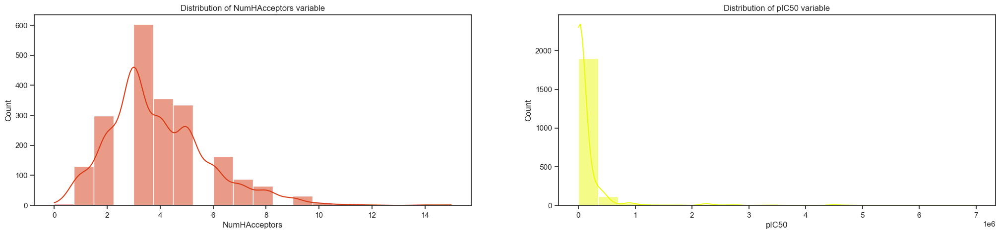

In [64]:
fig, axes = plt.subplots(1, 2, figsize = (25, 5))
ax = axes.flatten()
sns.histplot(ax = axes[0], x = dfProp["NumHAcceptors"], bins = 20, kde = True, color = "#D63913").set(title = "Distribution of NumHAcceptors variable");
sns.histplot(ax = axes[1], x = dfProp["pIC50"], bins = 20, kde = True, color = "#EAF90E").set(title = "Distribution of pIC50 variable");

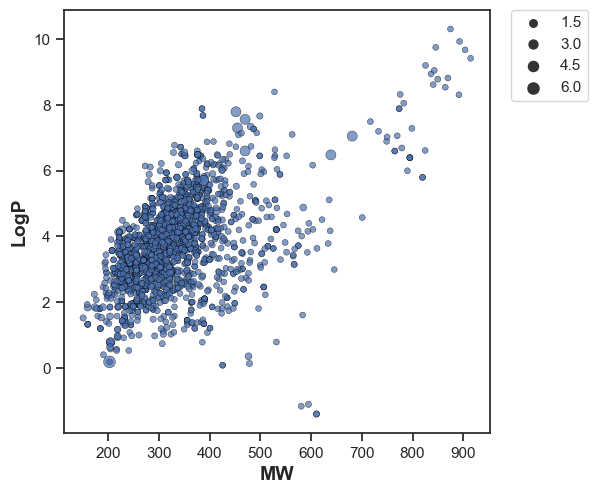

In [65]:
plt.figure(figsize=(5.5, 5.5))

sns.scatterplot(x='MW', y='LogP', data=dfProp, size='pIC50', edgecolor='black', alpha=0.7)

plt.xlabel('MW', fontsize=14, fontweight='bold')
plt.ylabel('LogP', fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)

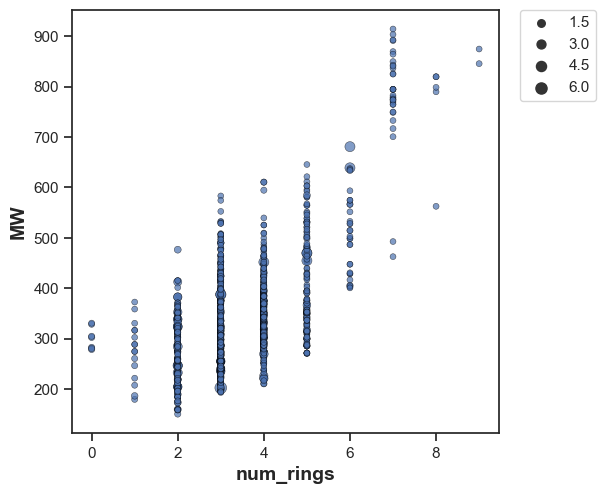

In [66]:
plt.figure(figsize=(5.5, 5.5))

sns.scatterplot(x='num_rings', y='MW', data=dfProp, size='pIC50', edgecolor='black', alpha=0.7)

plt.xlabel('num_rings', fontsize=14, fontweight='bold')
plt.ylabel('MW', fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)

Text(0, 0.5, 'pIC50 value')

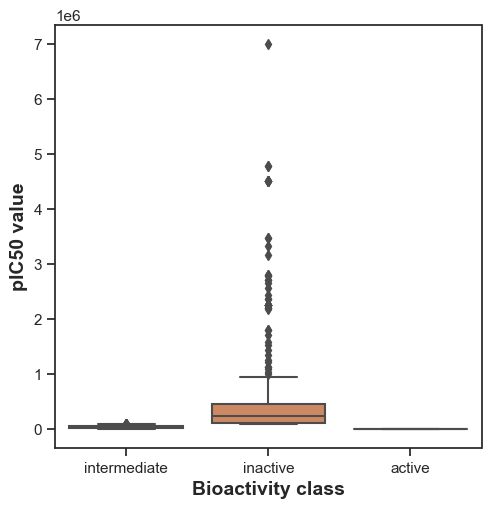

In [67]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'Class', y = 'pIC50', data = dfProp)

plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('pIC50 value', fontsize=14, fontweight='bold')


Text(0, 0.5, 'MW')

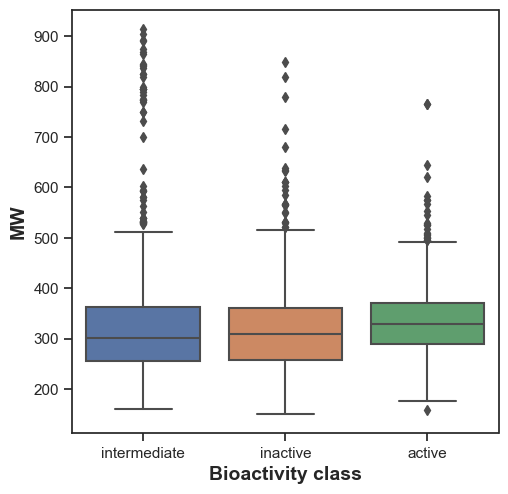

In [68]:
plt.figure(figsize=(5.5, 5.5))

sns.boxplot(x = 'Class', y = 'MW', data = dfProp)
plt.xlabel('Bioactivity class', fontsize=14, fontweight='bold')
plt.ylabel('MW', fontsize=14, fontweight='bold')

In [69]:
#export 
dfProp.to_csv('DfProparom.csv', index=False)

In [6]:
#Import after imputation
dfProp= pd.read_csv('DfProparom.csv')

In [9]:
df=dfProp

In [71]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.


In [7]:
# Import necessary libraries
import pandas as pd
from imblearn.over_sampling import RandomOverSampler

# Load the dataset
dftest=df

# Separate features and target
X = dftest.drop("Class", axis=1)
y = dftest["Class"]

# Instantiate the RandomOverSampler
ros = RandomOverSampler(random_state=0)

# Resample the data
X_resampled, y_resampled = ros.fit_resample(X, y)

# Convert the resampled data to a new DataFrame
dfBalanced = pd.DataFrame(X_resampled, columns=X.columns)
dfBalanced["Class"] = y_resampled

# Verify the class distribution of the resampled data
print(dfBalanced["Class"].value_counts())

NameError: name 'df' is not defined

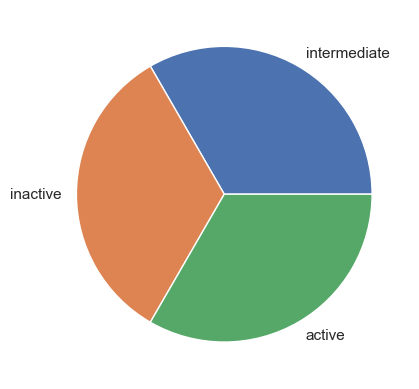

In [73]:
dfbao = pd.DataFrame(dfBalanced['Class'])
value_counts = dfBalanced['Class'].value_counts()
new_df = pd.DataFrame({'Class': value_counts.index, 'count': value_counts.values})
y = dfBalanced['Class'].value_counts()
mylabels = new_df['Class']
plt.pie(y, labels = mylabels)
plt.show() 

In [74]:
#export 
dfProp.to_csv('DfProperty.csv', index=False)

In [8]:
#Import after imputation
dfProp= pd.read_csv('DfProperty.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'DfProperty.csv'

# VAE Tutorial  

In [76]:
!pip -q install rdkit-pypi==2021.9.4

ERROR: Could not install packages due to an OSError: [WinError 5] Accès refusé: 'D:\\sw\\conda\\Lib\\site-packages\\rdkit\\rdBase.pyd'
Consider using the `--user` option or check the permissions.



In [5]:
df = pd.read_csv("DfProparom.csv")
df['canonical_smiles']

0               CC12CCC(O)CC1=CCC1C2CCC2(C)C(CC3CN3)CCC12
1       C[C@]12CC[C@H]3[C@@H](CC=C4C[C@@H](O)CC[C@@]43...
2           CCn1c(C(c2ccc(F)cc2)n2ccnc2)c(C)c2cc(Br)ccc21
3                  CCn1cc(C(c2ccc(F)cc2)n2ccnc2)c2ccccc21
4                      Clc1ccccc1Cn1cc(Cn2ccnc2)c2ccccc21
                              ...                        
2087               CC(Cn1ccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1
2088            CCC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1
2089             CC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1
2090          CCC(CCc1c[nH]cn1)=C(c1ccc(O)cc1)c1ccc(O)cc1
2091           CC(CCc1c[nH]cn1)=C(c1ccc(O)cc1)c1ccc(O)cc1
Name: canonical_smiles, Length: 2092, dtype: object

In [29]:
column = df['canonical_smiles']

with open('Aromatase.txt', 'w') as file:
    column.to_csv(file, index=False, header=False)

In [6]:
df = df['canonical_smiles']

In [7]:
df

0               CC12CCC(O)CC1=CCC1C2CCC2(C)C(CC3CN3)CCC12
1       C[C@]12CC[C@H]3[C@@H](CC=C4C[C@@H](O)CC[C@@]43...
2           CCn1c(C(c2ccc(F)cc2)n2ccnc2)c(C)c2cc(Br)ccc21
3                  CCn1cc(C(c2ccc(F)cc2)n2ccnc2)c2ccccc21
4                      Clc1ccccc1Cn1cc(Cn2ccnc2)c2ccccc21
                              ...                        
2087               CC(Cn1ccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1
2088            CCC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1
2089             CC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1
2090          CCC(CCc1c[nH]cn1)=C(c1ccc(O)cc1)c1ccc(O)cc1
2091           CC(CCc1c[nH]cn1)=C(c1ccc(O)cc1)c1ccc(O)cc1
Name: canonical_smiles, Length: 2092, dtype: object

In [10]:
#df = pd.read_csv("DfProperty.csv")
df["smiles"] = df["canonical_smiles"].apply(lambda s: s.replace("\n", ""))
#df.head()

In [11]:

# Define a function to calculate the QED value for a given SMILES string
def calculate_qed(smiles):
    mol = Chem.MolFromSmiles(smiles)
    qed_value = QED.qed(mol)
    return qed_value

# Apply the function to the 'canobnical_smiles' column of the DataFrame
df['qed'] = df['canonical_smiles'].apply(calculate_qed)

# Print the DataFrame with the QED values
df


,molecule_chembl_id,pIC50,canonical_smiles,standard_value,num_rings,num_atoms,Class,Class.1,MW,LogP,NumHDonors,NumHAcceptors,PolarSurface,Rotatable,ValenceElect,NumAliphaticCarboc,NumHeteroat,smiles,qed
0,CHEMBL341591,63900.0,CC12CCC(O)CC1=CCC1C2CCC2(C)C(CC3CN3)CCC12,7100.0,5,24,intermediate,intermediate,329.528,4.28820,2.0,2.0,42.17,2.0,134.0,4.0,2.0,CC12CCC(O)CC1=CCC1C2CCC2(C)C(CC3CN3)CCC12,0.586090
1,CHEMBL2111947,450000.0,C[C@]12CC[C@H]3[C@@H](CC=C4C[C@@H](O)CC[C@@]43...,50000.0,5,23,inactive,inactive,315.501,3.89810,2.0,2.0,42.17,1.0,128.0,4.0,2.0,C[C@]12CC[C@H]3[C@@H](CC=C4C[C@@H](O)CC[C@@]43...,0.569100
2,CHEMBL431859,2142.0,CCn1c(C(c2ccc(F)cc2)n2ccnc2)c(C)c2cc(Br)ccc21,238.0,4,26,active,active,412.306,5.70542,0.0,3.0,22.75,4.0,132.0,0.0,5.0,CCn1c(C(c2ccc(F)cc2)n2ccnc2)c(C)c2cc(Br)ccc21,0.421397
3,CHEMBL113637,513.0,CCn1cc(C(c2ccc(F)cc2)n2ccnc2)c2ccccc21,57.0,4,24,active,active,319.383,4.63450,0.0,3.0,22.75,4.0,120.0,0.0,4.0,CCn1cc(C(c2ccc(F)cc2)n2ccnc2)c2ccccc21,0.537379
4,CHEMBL112021,486.0,Clc1ccccc1Cn1cc(Cn2ccnc2)c2ccccc21,54.0,4,23,active,active,321.811,4.58780,0.0,3.0,22.75,4.0,114.0,0.0,4.0,Clc1ccccc1Cn1cc(Cn2ccnc2)c2ccccc21,0.538891
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2087,CHEMBL5087363,9018.0,CC(Cn1ccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,1002.0,3,23,intermediate,intermediate,306.365,3.81630,2.0,4.0,58.28,4.0,116.0,0.0,4.0,CC(Cn1ccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,0.770202
2088,CHEMBL5092560,8100.0,CCC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,900.0,3,26,active,active,345.442,5.33750,2.0,3.0,53.35,6.0,132.0,0.0,3.0,CCC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,0.634061
2089,CHEMBL5092843,29160.0,CC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,3240.0,3,25,intermediate,intermediate,331.415,4.94740,2.0,3.0,53.35,5.0,126.0,0.0,3.0,CC(CCc1cccnc1)=C(c1ccc(O)cc1)c1ccc(O)cc1,0.695493
2090,CHEMBL5074047,468.0,CCC(CCc1c[nH]cn1)=C(c1ccc(O)cc1)c1ccc(O)cc1,52.0,3,25,active,active,334.419,4.66560,3.0,3.0,69.14,6.0,128.0,0.0,4.0,CCC(CCc1c[nH]cn1)=C(c1ccc(O)cc1)c1ccc(O)cc1,0.613595


In [9]:
from rdkit import Chem



# Get the unique atomic symbols present in the SMILES strings
unique_atoms = set()
for smile in df:
    mol = Chem.MolFromSmiles(smile)
    atoms = mol.GetAtoms()
    for atom in atoms:
        symbol = atom.GetSymbol()
        unique_atoms.add(symbol)

# Print the unique atomic symbols
print("Unique atoms:", unique_atoms)


Unique atoms: {'F', 'Br', 'C', 'Se', 'N', 'S', 'I', 'O', 'Cl'}


In [13]:
def molecule_from_smiles(smiles):
    # MolFromSmiles(m, sanitize=True) should be equivalent to
    # MolFromSmiles(m, sanitize=False) -> SanitizeMol(m) -> AssignStereochemistry(m, ...)
    molecule = Chem.MolFromSmiles(smiles, sanitize=False)

    # If sanitization is unsuccessful, catch the error, and try again without
    # the sanitization step that caused the error
    flag = Chem.SanitizeMol(molecule, catchErrors=True)
    if flag != Chem.SanitizeFlags.SANITIZE_NONE:
        Chem.SanitizeMol(molecule, sanitizeOps=Chem.SanitizeFlags.SANITIZE_ALL ^ flag)

    Chem.AssignStereochemistry(molecule, cleanIt=True, force=True)
    return molecule

SMILES:	CC(=O)OCC12CCCC=C1CCC1C2CCC2(C)C(OC(C)=O)CCC12
Molecule:


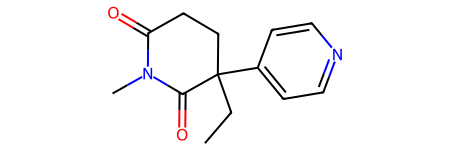

In [14]:
print(f"SMILES:\t{df[100]}")
molecule = molecule_from_smiles(df.iloc[29])
print("Molecule:")
molecule

In [15]:
import ast 

In [17]:
#SMILE_CHARSET = '["C", "B", "F", "I", "H", "O", "N", "S", "P", "Cl", "Br"]'          
SMILE_CHARSET= '["S", "Se", "C", "F", "N", "I", "O", "Cl", "Br","H"]'
				 #'C', 'Se', 'N', 'S', 'I', 'Br', 'O', 'Cl', 'F'
bond_mapping = {
    "SINGLE": 0,
    0: Chem.BondType.SINGLE,
    "DOUBLE": 1,
    1: Chem.BondType.DOUBLE,
    "TRIPLE": 2,
    2: Chem.BondType.TRIPLE,
    "AROMATIC": 3,
    3: Chem.BondType.AROMATIC,
}
SMILE_CHARSET = ast.literal_eval(SMILE_CHARSET)

MAX_MOLSIZE = max(df.str.len())
SMILE_to_index = dict((c, i) for i, c in enumerate(SMILE_CHARSET))
index_to_SMILE = dict((i, c) for i, c in enumerate(SMILE_CHARSET))
atom_mapping = dict(SMILE_to_index)
atom_mapping.update(index_to_SMILE)

print("Max molecule size: {}".format(MAX_MOLSIZE))
print("Character set Length: {}".format(len(SMILE_CHARSET)))



Max molecule size: 123
Character set Length: 10


## Hyperparameter

In [18]:
BATCH_SIZE = 16
EPOCHS =4

VAE_LR = 5e-4
NUM_ATOMS = 123 # Maximum number of atoms
#ATOM_DIM = 9
ATOM_DIM = len(SMILE_CHARSET)  # Number of atom types
BOND_DIM = 3 + 1  # Number of bond types
LATENT_DIM = 435  # Size of the latent space

In [18]:

def smiles_to_graph(smiles):
    # Converts SMILES to molecule object
    molecule = Chem.MolFromSmiles(smiles)

    # Initialize adjacency and feature tensor
    adjacency = np.zeros((BOND_DIM, NUM_ATOMS, NUM_ATOMS), "float32")
    features = np.zeros((NUM_ATOMS, ATOM_DIM), "float32")

    # loop over each atom in molecule
    for atom in molecule.GetAtoms():
        i = atom.GetIdx()
        atom_type = atom_mapping[atom.GetSymbol()]
        features[i] = np.eye(ATOM_DIM)[atom_type]
        # loop over one-hop neighbors
        for neighbor in atom.GetNeighbors():
            j = neighbor.GetIdx()
            bond = molecule.GetBondBetweenAtoms(i, j)
            bond_type_idx = bond_mapping[bond.GetBondType().name]
            adjacency[bond_type_idx, [i, j], [j, i]] = 1

    # Where no bond, add 1 to last channel (indicating "non-bond")
    # Notice: channels-first
    adjacency[-1, np.sum(adjacency, axis=0) == 0] = 1

    # Where no atom, add 1 to last column (indicating "non-atom")
    features[np.where(np.sum(features, axis=1) == 0)[0], -1] = 1

    return adjacency, features




In [19]:
def graph_to_molecule(graph):
    # Unpack graph
    adjacency, features = graph

    # RWMol is a molecule object intended to be edited
    molecule = Chem.RWMol()

    # Remove "no atoms" & atoms with no bonds
    keep_idx = np.where(
        (np.argmax(features, axis=1) != ATOM_DIM - 1)
        & (np.sum(adjacency[:-1], axis=(0, 1)) != 0)
    )[0]
    features = features[keep_idx]
    adjacency = adjacency[:, keep_idx, :][:, :, keep_idx]

    # Add atoms to molecule
    for atom_type_idx in np.argmax(features, axis=1):
        atom = Chem.Atom(atom_mapping[atom_type_idx])
        _ = molecule.AddAtom(atom)

    # Add bonds between atoms in molecule; based on the upper triangles
    # of the [symmetric] adjacency tensor
    (bonds_ij, atoms_i, atoms_j) = np.where(np.triu(adjacency) == 1)
    for (bond_ij, atom_i, atom_j) in zip(bonds_ij, atoms_i, atoms_j):
        if atom_i == atom_j or bond_ij == BOND_DIM - 1:
            continue
        bond_type = bond_mapping[bond_ij]
        molecule.AddBond(int(atom_i), int(atom_j), bond_type)

    # Sanitize the molecule; for more information on sanitization, see
    # https://www.rdkit.org/docs/RDKit_Book.html#molecular-sanitization
    flag = Chem.SanitizeMol(molecule, catchErrors=True)
    # Let's be strict. If sanitization fails, return None
    if flag != Chem.SanitizeFlags.SANITIZE_NONE:
        return None

    return molecule

## DataLoader

In [20]:
class DataGenerator(keras.utils.Sequence):
    def __init__(self, data, mapping, max_len, batch_size=6, shuffle=True):
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.mapping = mapping
        self.max_len = max_len
        self.batch_size = batch_size
        self.shuffle = shuffle
        
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        mol_features, mol_property = self.data_generation(batch)

        return mol_features, mol_property

    def on_epoch_end(self):

        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, idx):
        """
        Load molecules adjacency matrix and features matrix from SMILE representation 
        and their respective SAS value.
        """
        qed = self.data.loc[idx]['qed']

        adjacency, features = smiles_to_graph(self.data.loc[idx]['canonical_smiles'])

        return adjacency, features, qed

        
    def data_generation(self, batch):

        x1 = np.empty((self.batch_size, BOND_DIM, self.max_len, self.max_len))
        x2 = np.empty((self.batch_size, self.max_len, len(self.mapping)))
        x3 = np.empty((self.batch_size, ))
        
        for i, batch_id in enumerate(batch):
            x1[i,], x2[i,], x3[i,] = self.load(batch_id)

        return [x1, x2], x3


# Generate training set

In [34]:
train_df = df.sample(frac=0.75,random_state=42) #random state is a seed value
test_df = df.drop(train_df.index)
train_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)

In [35]:
class RelationalGraphConvLayer(keras.layers.Layer):
    def __init__(
        self,
        units=128,
        activation="relu",
        use_bias=False,
        kernel_initializer="glorot_uniform",
        bias_initializer="zeros",
        kernel_regularizer=None,
        bias_regularizer=None,
        **kwargs
    ):
        super().__init__(**kwargs)

        self.units = units
        self.activation = keras.activations.get(activation)
        self.use_bias = use_bias
        self.kernel_initializer = keras.initializers.get(kernel_initializer)
        self.bias_initializer = keras.initializers.get(bias_initializer)
        self.kernel_regularizer = keras.regularizers.get(kernel_regularizer)
        self.bias_regularizer = keras.regularizers.get(bias_regularizer)

    def build(self, input_shape):
        bond_dim = input_shape[0][1]
        atom_dim = input_shape[1][2]

        self.kernel = self.add_weight(
            shape=(bond_dim, atom_dim, self.units),
            initializer=self.kernel_initializer,
            regularizer=self.kernel_regularizer,
            trainable=True,
            name="W",
            dtype=tf.float32,
        )

        if self.use_bias:
            self.bias = self.add_weight(
                shape=(bond_dim, 1, self.units),
                initializer=self.bias_initializer,
                regularizer=self.bias_regularizer,
                trainable=True,
                name="b",
                dtype=tf.float32,
            )

        self.built = True

    def call(self, inputs, training=False):
        adjacency, features = inputs
        # Aggregate information from neighbors
        x = tf.matmul(adjacency, features[:, None, :, :])
        # Apply linear transformation
        x = tf.matmul(x, self.kernel)
        if self.use_bias:
            x += self.bias
        # Reduce bond types dim
        x_reduced = tf.reduce_sum(x, axis=1)
        # Apply non-linear transformation
        return self.activation(x_reduced)

## Encoder

In [36]:
def get_encoder(gconv_units, latent_dim, adjacency_shape, feature_shape, dense_units,dropout_rate ):
    '''
    Reference: https://keras.io/examples/generative/wgan-graphs/
    '''
    adjacency = keras.layers.Input(shape=adjacency_shape)
    features = keras.layers.Input(shape=feature_shape)

    # Propagate through one or more graph convolutional layers
    features_transformed = features
    for units in gconv_units:
        features_transformed = RelationalGraphConvLayer(units)(
            [adjacency, features_transformed]
        )
    # Reduce 2-D representation of molecule to 1-D
    x = keras.layers.GlobalAveragePooling1D()(features_transformed)

    # Propagate through one or more densely connected layers
    for units in dense_units:
        x = layers.Dense(units, activation="relu")(x)
        x = layers.Dropout(dropout_rate)(x)
    
    z_mean = layers.Dense(latent_dim, dtype="float32", name="z_mean")(x)
    log_var = layers.Dense(latent_dim, dtype="float32", name="log_var")(x)
    
    encoder = keras.Model([adjacency, features], [z_mean, log_var], name="encoder")

    return encoder

def get_decoder(dense_units, dropout_rate, latent_dim, adjacency_shape, feature_shape):
    '''
    Reference: https://keras.io/examples/generative/wgan-graphs/
    '''
    latent_inputs = keras.Input(shape=(latent_dim,))

    x = latent_inputs
    for units in dense_units:
        x = keras.layers.Dense(units, activation="tanh")(x)
        x = keras.layers.Dropout(dropout_rate)(x)

    # Map outputs of previous layer (x) to [continuous] adjacency tensors (x_adjacency)
    x_adjacency = keras.layers.Dense(tf.math.reduce_prod(adjacency_shape))(x)
    x_adjacency = keras.layers.Reshape(adjacency_shape)(x_adjacency)
    # Symmetrify tensors in the last two dimensions
    x_adjacency = (x_adjacency + tf.transpose(x_adjacency, (0, 1, 3, 2))) / 2
    x_adjacency = keras.layers.Softmax(axis=1)(x_adjacency)

    # Map outputs of previous layer (x) to [continuous] feature tensors (x_features)
    x_features = keras.layers.Dense(tf.math.reduce_prod(feature_shape))(x)
    x_features = keras.layers.Reshape(feature_shape)(x_features)
    x_features = keras.layers.Softmax(axis=2)(x_features)


    decoder = keras.Model(latent_inputs, outputs=[x_adjacency, x_features], name="decoder")

    return decoder

## Build Sampling layer¶

In [37]:
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_log_var)[0]
        dim = tf.shape(z_log_var)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

## Build the VAE 

In [47]:
class MoleculeGenerator(keras.Model):
    def __init__(self, encoder, decoder, max_len, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.property_prediction_layer = layers.Dense(1)
        self.max_len = max_len

        self.train_total_loss_tracker = keras.metrics.Mean(name="train_total_loss")
        self.val_total_loss_tracker = keras.metrics.Mean(name="val_total_loss")

    def train_step(self, data):
        mol_features, mol_property = data
        graph_real = mol_features
        self.batch_size = tf.shape(mol_property)[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, property_prediction, \
             reconstruction_adjacency, reconstruction_features = self(mol_features,
                                                                             training=True)
            graph_generated = [reconstruction_adjacency, reconstruction_features]
            total_loss = self.calculate_loss(z_log_var,
                                             z_mean,
                                             mol_property,
                                             property_prediction,
                                             graph_real,
                                             graph_generated,
                                             is_train=True)

        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))

        self.train_total_loss_tracker.update_state(total_loss)
        return {
            "loss": self.train_total_loss_tracker.result(),
        }

    def test_step(self, data):
        mol_features, mol_property = data
        z_mean, z_log_var, property_prediction, \
        reconstruction_adjacency, reconstruction_features = self(mol_features,
                                                                training=False)
        total_loss = self.calculate_loss(z_log_var,
                                        z_mean,
                                        mol_property, 
                                        property_prediction,
                                        graph_real=mol_features,
                                        graph_generated=[reconstruction_adjacency, 
                                                         reconstruction_features],
                                        is_train=False)

        self.val_total_loss_tracker.update_state(total_loss)
        return {
            "loss": self.val_total_loss_tracker.result()
        }

    def calculate_loss(self,
                       z_log_var,
                       z_mean,
                       mol_property,
                       property_prediction,
                       graph_real,
                       graph_generated,
                       is_train):
        adjacency_real, features_real = graph_real
        adjacency_generated, features_generated = graph_generated
        
        adjacency_reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.categorical_crossentropy(
                                                        adjacency_real,
                                                        adjacency_generated
                                                        ),
                                                        axis=(1,2)
                    )
            )
        features_reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.categorical_crossentropy(
                                                        features_real,
                                                        features_generated
                                                        ),
                                                        axis=(1)
                    )
            )
        kl_loss = -0.5 * tf.reduce_sum(1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var), 1)
        kl_loss = tf.reduce_mean(kl_loss)

        property_prediction_loss = tf.reduce_mean(
            keras.losses.binary_crossentropy(mol_property, 
                                                property_prediction)
        )

        if is_train:
            graph_loss = self._gradient_penalty(graph_real, graph_generated)
        else:
            graph_loss = 0

        return kl_loss + property_prediction_loss + graph_loss + adjacency_reconstruction_loss + features_reconstruction_loss

    def _gradient_penalty(self, graph_real, graph_generated):
        # Unpack graphs
        adjacency_real, features_real = graph_real
        adjacency_generated, features_generated = graph_generated

        # Generate interpolated graphs (adjacency_interp and features_interp)
        alpha = tf.random.uniform([self.batch_size])
        alpha = tf.reshape(alpha, (self.batch_size, 1, 1, 1))
        adjacency_interp = (adjacency_real * alpha) + (1 - alpha) * adjacency_generated
        alpha = tf.reshape(alpha, (self.batch_size, 1, 1))
        features_interp = (features_real * alpha) + (1 - alpha) * features_generated

        # Compute the logits of interpolated graphs
        with tf.GradientTape() as tape:
            tape.watch(adjacency_interp)
            tape.watch(features_interp)
            _, _, logits, _,_ = self(
                [adjacency_interp, features_interp], training=True
            )

        # Compute the gradients with respect to the interpolated graphs
        grads = tape.gradient(logits, [adjacency_interp, features_interp])
        # Compute the gradient penalty
        grads_adjacency_penalty = (1 - tf.norm(grads[0], axis=1)) ** 2
        grads_features_penalty = (1 - tf.norm(grads[1], axis=2)) ** 2
        return tf.reduce_mean(
            tf.reduce_mean(grads_adjacency_penalty, axis=(-2, -1))
            + tf.reduce_mean(grads_features_penalty, axis=(-1))
        )
    
    def inference(self, batch_size):
        z = tf.random.normal((batch_size, LATENT_DIM))
        reconstruction_adjacency, reconstruction_features = model.decoder.predict(z)
        # obtain one-hot encoded adjacency tensor
        adjacency = tf.argmax(reconstruction_adjacency, axis=1)
        adjacency = tf.one_hot(adjacency, depth=BOND_DIM, axis=1)
        # Remove potential self-loops from adjacency
        adjacency = tf.linalg.set_diag(adjacency, tf.zeros(tf.shape(adjacency)[:-1]))
        # obtain one-hot encoded feature tensor
        features = tf.argmax(reconstruction_features, axis=2)
        features = tf.one_hot(features, depth=ATOM_DIM, axis=2)
        return [
            graph_to_molecule([adjacency[i].numpy(), features[i].numpy()])
            for i in range(batch_size)
        ]
    
    def call(self, inputs):
        z_mean, log_var = self.encoder(inputs)
        z = Sampling()([z_mean, log_var])

        reconstruction_adjacency, reconstruction_features = self.decoder(z)

        property_prediction = self.property_prediction_layer(z_mean)

        return z_mean, log_var, property_prediction, reconstruction_adjacency, reconstruction_features
    def get_config(self):
        config = super().get_config().copy()
        # Add any custom hyperparameters here
        return config

In [23]:
def inference(model, batch_size):
    z = tf.random.normal((batch_size, LATENT_DIM))
    reconstruction_adjacency, reconstruction_features = model.decoder.predict(z)
    # obtain one-hot encoded adjacency tensor
    adjacency = tf.argmax(reconstruction_adjacency, axis=1)
    adjacency = tf.one_hot(adjacency, depth=BOND_DIM, axis=1)
    # Remove potential self-loops from adjacency
    adjacency = tf.linalg.set_diag(adjacency, tf.zeros(tf.shape(adjacency)[:-1]))
    # obtain one-hot encoded feature tensor
    features = tf.argmax(reconstruction_features, axis=2)
    features = tf.one_hot(features, depth=ATOM_DIM, axis=2)
    return [
        graph_to_molecule([adjacency[i].numpy(), features[i].numpy()])
        for i in range(batch_size)
    ]

## Train the model 

In [48]:
train_loader = DataGenerator(
    data=train_df[:850],
    mapping = SMILE_to_index, 
    max_len = NUM_ATOMS,
    batch_size=BATCH_SIZE
)

validation_loader = DataGenerator(
    data=test_df[:850],
    mapping = SMILE_to_index, 
    max_len = NUM_ATOMS,
    batch_size=BATCH_SIZE
    )

In [49]:
vae_optimizer = tf.keras.optimizers.Adam(learning_rate=VAE_LR)

encoder = get_encoder(
    gconv_units=[9],
    adjacency_shape=(BOND_DIM, NUM_ATOMS, NUM_ATOMS),
    feature_shape=(NUM_ATOMS, ATOM_DIM),
    latent_dim=LATENT_DIM,
    dense_units=[512],
    dropout_rate=0.0,
)
decoder = get_decoder(
    dense_units=[128, 256, 512],
    dropout_rate=0.2,
    latent_dim=LATENT_DIM,
    adjacency_shape=(BOND_DIM, NUM_ATOMS, NUM_ATOMS),
    feature_shape=(NUM_ATOMS, ATOM_DIM)
)
model = MoleculeGenerator(encoder, 
                          decoder,
                          MAX_MOLSIZE)

model.compile(vae_optimizer)
history = model.fit(train_loader, epochs=EPOCHS, validation_data=validation_loader)

Epoch 1/4
54/54 [==============================] - 24s 382ms/step - loss: 73376.3418 - val_loss: 72877.3906
Epoch 2/4
54/54 [==============================] - 143s 3s/step - loss: 72826.0511 - val_loss: 72812.5234                                                                                                                                                                                      
Epoch 3/4
54/54 [==============================] - 143s 3s/step - loss: 72847.5006 - val_loss: 72794.4688                                                                                                                                                                                      
Epoch 4/4
54/54 [==============================] - 146s 3s/step - loss: 72832.3895 - val_loss: 72778.0078                                                                                                                                                                                      


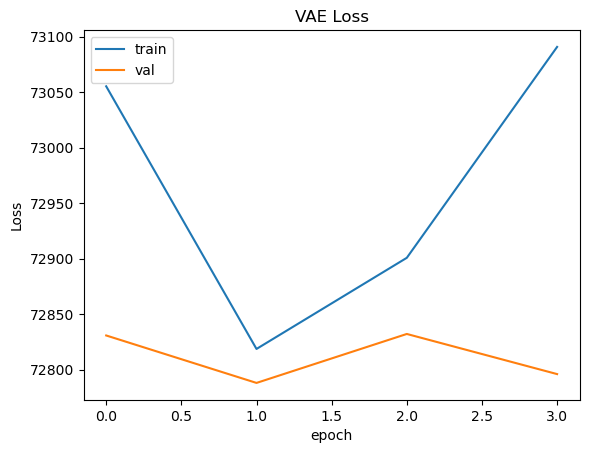

In [29]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('VAE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## Model Inferencing 

In [50]:
molecules = model.inference(800)
molecules

25/25 [==============================] - 1s 39ms/step


 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [26]:
from molvs.validate import Validator
from rdkit.Chem import Descriptors
molecules_valides=[]
c=0
for mol in molecules:
    # Convertir la molécule en objet Mol
    if mol is None: 
        c=c+1
    else:
        mol1 = mol.GetMol()
        mw = Chem.Descriptors.MolWt(mol1)  # Poids moléculaire
        logp = Chem.Descriptors.MolLogP(mol1)  # LogP
        hba = Chem.Descriptors.NumHAcceptors(mol1)  # Nombre d'accepteurs de liaison hydrogène
        hbd = Chem.Descriptors.NumHDonors(mol1)  # Nombre de donneurs de liaison hydrogène

        # Afficher les résultats

        # Vérifier si la molécule satisfait les critères de la règle de Lipinski
        if mw <= 500 and logp <= 5 and hba <= 10 and hbd <= 5:
            molecules_valides.append(mol)
            # Convert list of RWMol objects to list of string representations
            molecules_smiles = [Chem.MolToSmiles(mol) for mol in molecules_valides]

            # Convert list of string representations to set to remove duplicates
            unique_molecules_smiles_set = set(molecules_smiles)
            # Convert set back to list of string representations
            unique_molecules_smiles_list = list(unique_molecules_smiles_set)

            # Convert list of string representations back to list of RWMol objects
            unique_molecules = [Chem.MolFromSmiles(smiles) for smiles in unique_molecules_smiles_list]
            unique_smiles = [Chem.MolToSmiles(mol) for mol in unique_molecules]

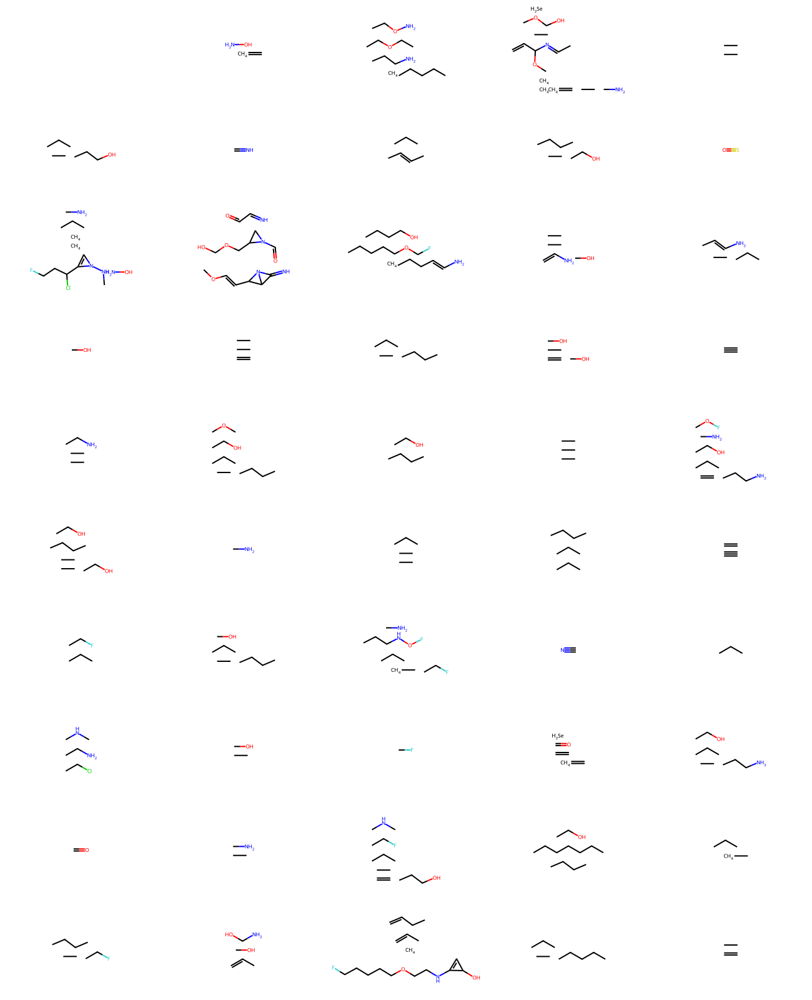

In [28]:
MolsToGridImage(
    [m for m in unique_molecules if m is not None][:1000], molsPerRow=5, subImgSize=(260, 160)
)

In [54]:
model.save('Vae_aromatase')

INFO:tensorflow:Assets written to: Vae_aromatase\assets


INFO:tensorflow:Assets written to: Vae_aromatase\assets


In [5]:
loaded_model = tf.keras.models.load_model('Vae_aromatase')

In [24]:
molecules = inference(loaded_model,1500)

47/47 [==============================] - 2s 41ms/step


In [25]:
from molvs import validate_smiles
valid_smiles_list=[]

def validate_canonical_smiles(smiles):
   
    try:
        # Use MolVS library to validate the SMILES
        valid = validate_smiles(smiles)
        return valid
    except:
        # If any exception occurs during MolVS processing, return False
        return False


for smiles in unique_smiles:
    if validate_canonical_smiles(smiles):
        print(f"{smiles} is a valid canonical SMILES.")
        valid_smiles_list.append(smiles)  # Add valid SMILES to the list
    else:
        print(f"{smiles} is an invalid canonical SMILES.")

print("Valid canonical SMILES:")
print(valid_smiles_list)

NameError: name 'unique_smiles' is not defined

In [34]:
valid_smiles_list

# Convert list of string representations to set to remove duplicates
unique_molecules_smiles_set = set(valid_smiles_list)
            # Convert set back to list of string representations
unique_molecules_smiles_list = list(valid_smiles_list)

            # Convert list of string representations back to list of RWMol objects
unique_molecules1 = [Chem.MolFromSmiles(smiles) for smiles in valid_smiles_list]
unique_smiles1 = [Chem.MolToSmiles(mol) for mol in unique_molecules]

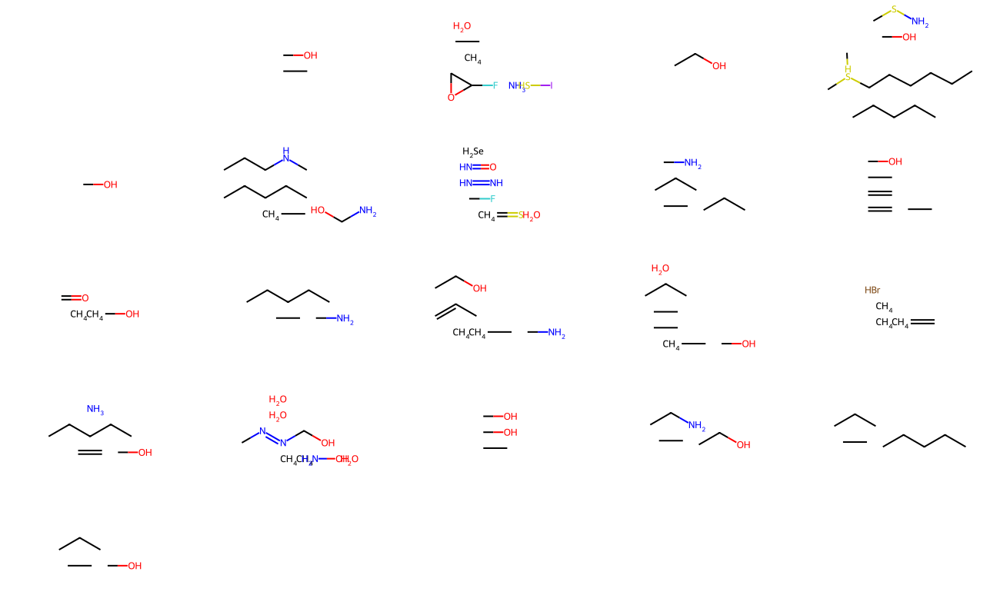

In [36]:
MolsToGridImage([m for m in unique_molecules1 if m is not None][:1000], molsPerRow=5, subImgSize=(260, 160))

# Display latent space clusters with respect to molecular properties (SAS)¶

27/27 [==============================] - 0s 7ms/step


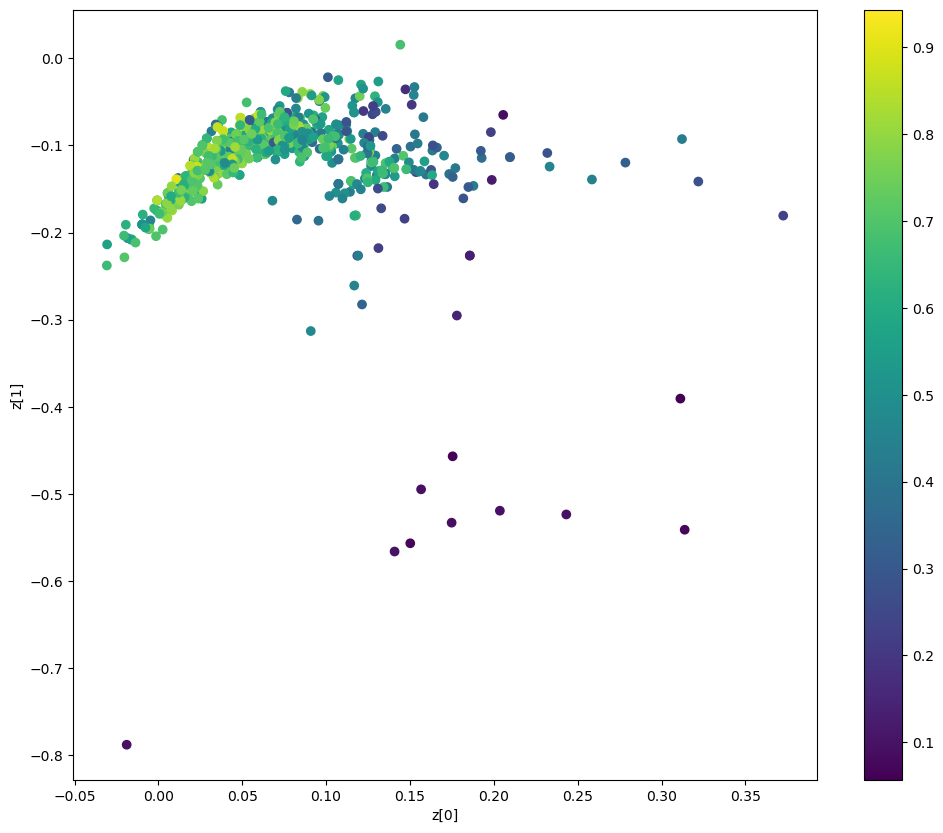

In [37]:
def plot_label_clusters(vae, data, labels):
    # display a 2D plot of the property in the latent space
    z_mean, _ = vae.encoder.predict(data)
    plt.figure(figsize=(12, 10))
    plt.scatter(z_mean[:, 0], z_mean[:, 1], c=labels)
    plt.colorbar()
    plt.xlabel("z[0]")
    plt.ylabel("z[1]")
    plt.show()


train_data = DataGenerator(
                            data=train_df,
                            mapping = SMILE_to_index, 
                            max_len = NUM_ATOMS,
                            batch_size=850
                        )
x_train, y_train = next(iter(train_data))
plot_label_clusters(model, x_train, y_train)